In [159]:
from pdf2image import convert_from_path
from PIL import Image
import numpy as np
import itertools,operator
import os
import logging as log
log.basicConfig(level=logging.INFO)

In [298]:
file_name = 'HP_MGEURO_MB_EUR-19.8.2020.pdf'

In [294]:
pages = convert_from_path(file_name, 600)

In [302]:
dir_name = f'original-{file_name[:-4]}'
os.mkdir(dir_name)

In [303]:
for i in range(len(pages)):
    pages[i].save(f'{dir_name}/{i:03d}.jpg', 'JPEG')

In [304]:
# (left, upper, right, lower)
def get_header(image, lowest):
    box = (0, 0, image.size[0], lowest)
    return image.crop(box)

def get_footer(image, highest):
    box = (0, image.size[1] - highest, image.size[0], image.size[1])
    return image.crop(box)

def get_body(image, highest, lowest):
    box = (0, highest, image.size[0], image.size[1] - lowest)
    return image.crop(box)

In [310]:
def split_in_half(image, epsilon=0.1, area=200):
    if epsilon == 0:
        raise KeyError('epsilon must be higher than 0')
    mat = np.array(image.convert('L'))
    means = np.mean(mat, axis=1)
    center = round(means.shape[0] / 2)
    
    length = 0
    best_center = None
    while (length < 1) or (best_center is None):
        seqs = list(list(y) for (x,y) in itertools.groupby((enumerate(means[center - area:center + area])), operator.itemgetter(1)) if x >= 255 - epsilon)
        epsilon *= 2
        length = len(seqs)
        

        min_delta = area * 2
        for seq in seqs:
#             if len(seq) > 1:
            avg = (np.mean([seq[0][0], seq[-1][0]]))
            delta = np.abs(area - avg)
            if min_delta > delta:
                min_delta = delta
                best_center = center - area + avg   
#         print(length, best_center)
    return get_header(image, best_center), image.crop((0, best_center, image.size[0], image.size[1]))

0 None
0 None
0 None
0 None
0 None
0 None
0 None
0 None
0 None
0 None
0 None
28 2912.0


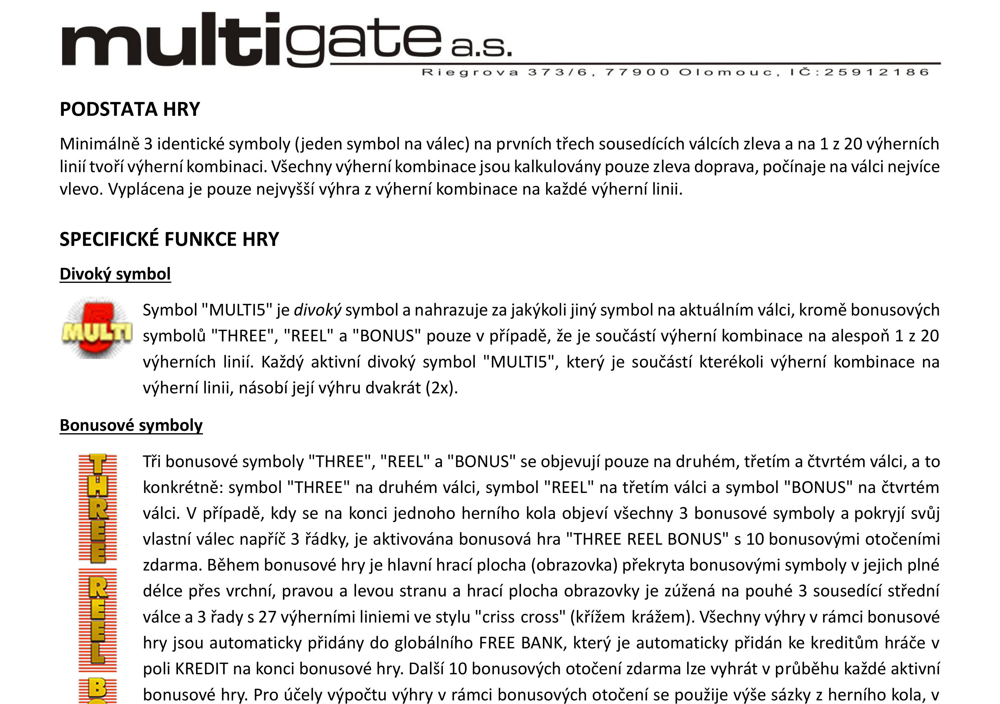

In [291]:
first, second = split_in_half(Image.open('original/075.jpg'), epsilon=0.001, area=200)
first

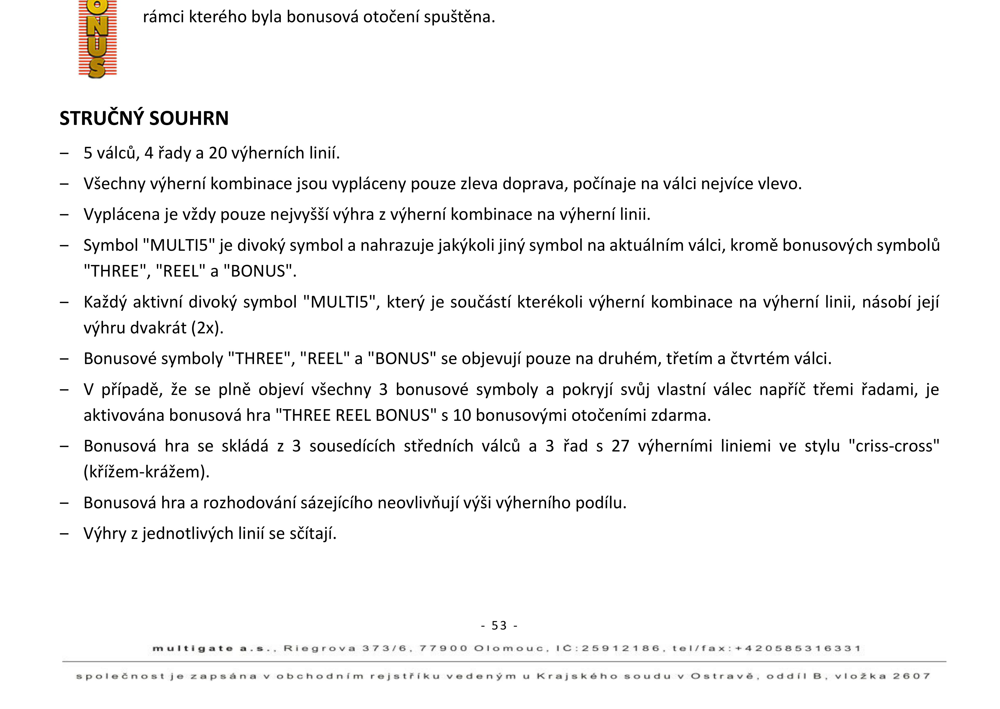

In [292]:
second

In [311]:
target_dir_name = f'split-{file_name[:-4]}'
# os.mkdir(target_dir_name)
i = 0
for entry in sorted(os.scandir(dir_name), key=lambda x: (x.is_dir(), x.name)):
    if entry.path.endswith('.jpg'):
        print(entry.path)
        first, second = split_in_half(Image.open(entry.path), epsilon=0.001, area=300)
        i += 1
        first.save(os.path.join(target_dir_name, f'{i:03d}' + '.jpg') , "JPEG")
        i += 1
        second.save(os.path.join(target_dir_name, f'{i:03d}' + '.jpg') , "JPEG")

original-HP_MGEURO_MB_EUR-19.8.2020/000.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/001.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/002.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/003.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/004.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/005.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/006.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/007.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/008.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/009.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/010.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/011.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/012.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/013.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/014.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/015.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/016.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/017.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/018.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/019.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/020.jpg
original-HP_MGEURO_MB_EUR-19.8.2020/021.jpg
original-HP_MGEURO_MB_EUR-19.8.2

In [171]:
r = (list(y) for (x,y) in itertools.groupby((enumerate([0] * 5 + [255] * 10 + [2] * 5 + [255] * 10)), operator.itemgetter(1)) if x >= 255)

In [172]:
list(r)

[[(5, 255),
  (6, 255),
  (7, 255),
  (8, 255),
  (9, 255),
  (10, 255),
  (11, 255),
  (12, 255),
  (13, 255),
  (14, 255)],
 [(20, 255),
  (21, 255),
  (22, 255),
  (23, 255),
  (24, 255),
  (25, 255),
  (26, 255),
  (27, 255),
  (28, 255),
  (29, 255)]]

In [62]:
im_body = get_body(im, header_size, footer_size)

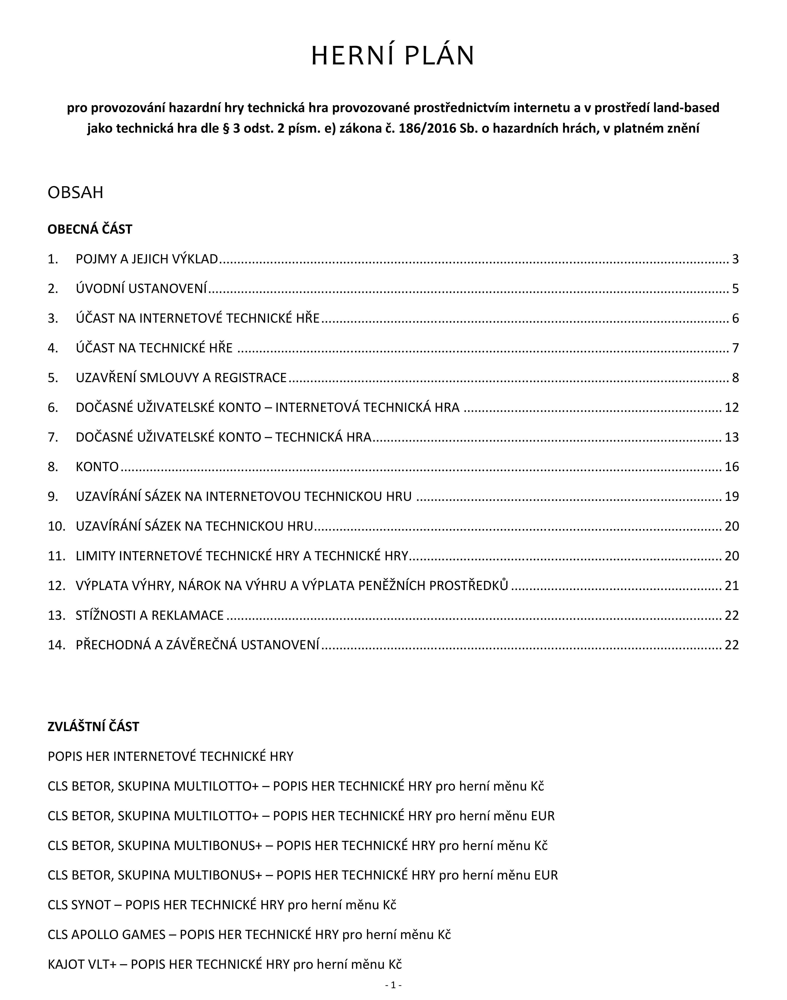

In [63]:
im_body

In [64]:
mat = np.array(im.convert('L'))

In [65]:
mat.shape

(5847, 4134)

In [66]:
means = np.mean(mat, axis=1)
center = round(means.shape[0] / 2
center

2924

In [67]:
center_plus = means[center:center + 200]

In [68]:

r = max((list(y) for (x,y) in itertools.groupby((enumerate(center_plus)), operator.itemgetter(1)) if x >= 250), key=len)
begin_index = r[0][0]
end_index = r[-1][0]
center_index = np.mean([begin_index, end_index]) + center
center_index

3003.5

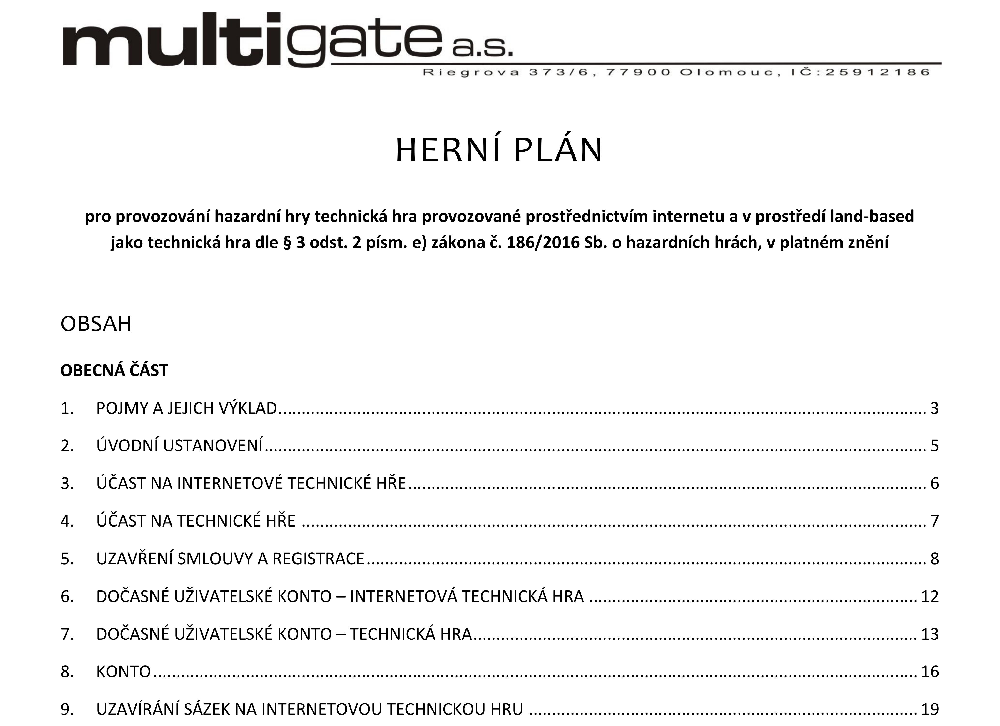

In [69]:
get_header(im, center_index)

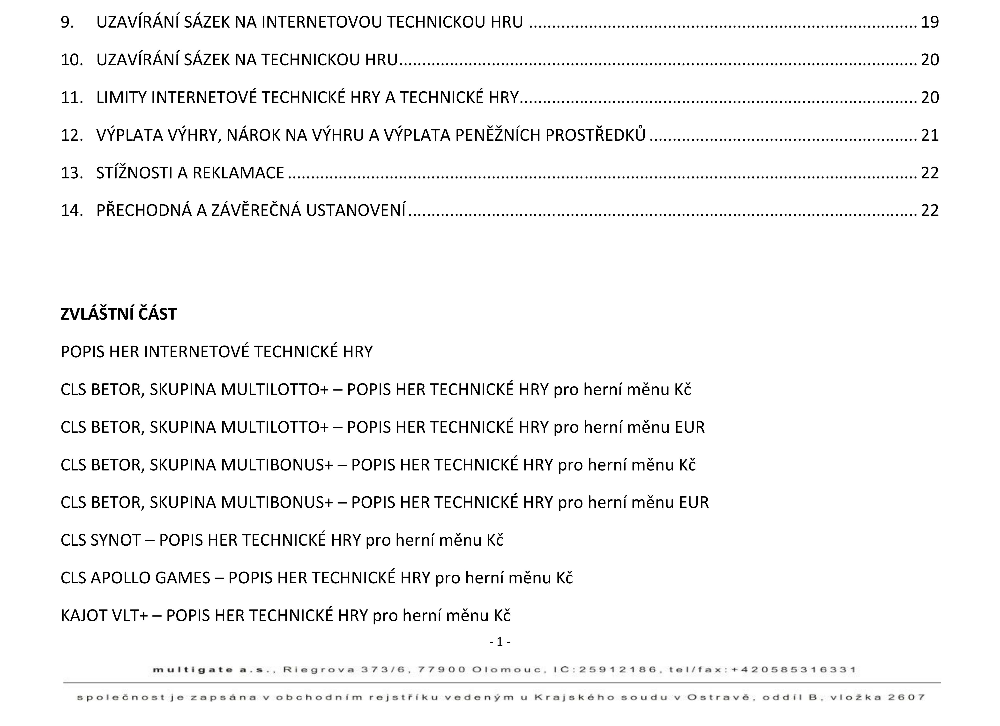

In [70]:
get_footer(im, center_index)